In [1]:
import os
import numpy as np
import matplotlib.pyplot as plt
import mdtraj as md
import torch
#import plotly.express as ex
from tqdm.notebook import tqdm

In [2]:
kB = 0.0083144621
temperature = 300
biasFactor = 10.0
_deltaT = temperature*(biasFactor-1)

In [3]:
bias_list = [np.load("./biases/"+i) for i in os.listdir("./biases")]
_totalBias = np.zeros_like(bias_list[0])
for bias in bias_list:
    _totalBias+=bias

In [4]:
FE = -((temperature+_deltaT)/_deltaT)*_totalBias

In [5]:
print(FE.min(), FE.max())

-164.20623597210232 -0.000882675248802655


In [6]:
FE -= np.min(FE)

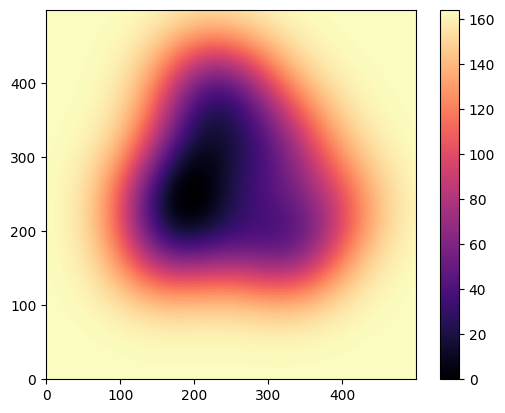

In [7]:
plt.imshow(FE, cmap='magma', norm='linear', aspect='equal', interpolation='none', origin='lower')
plt.colorbar()
plt.show()

In [8]:
traj = md.load("traj_metad.dcd", top="../aib9.gro")
X = torch.from_numpy(traj.xyz)
boxvectors = torch.from_numpy(traj.unitcell_vectors)

In [9]:
cv1 = torch.jit.load("cv1.pt")
cv2 = torch.jit.load("cv2.pt")

In [10]:
cv1_vals = torch.zeros(X.shape[0], )
cv2_vals = torch.zeros(X.shape[0], )
for i in tqdm(range(X.shape[0])):
    with torch.no_grad():
        cv1_vals[i] = (cv1(X[i, ...], boxvectors[i, ...]))
        cv2_vals[i] = (cv2(X[i, ...], boxvectors[i, ...]))

  0%|          | 0/100000 [00:00<?, ?it/s]

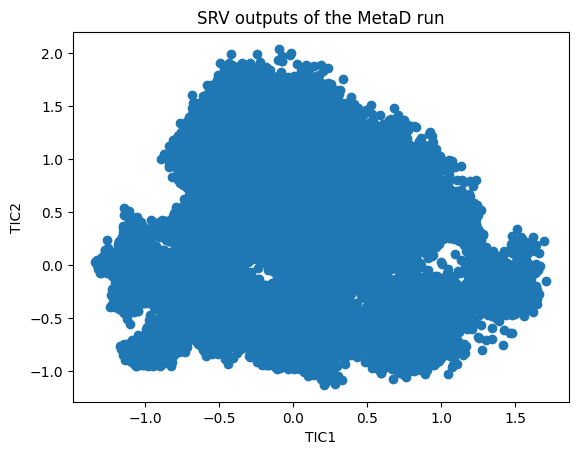

In [11]:
plt.scatter(cv1_vals, cv2_vals)
plt.ylabel("TIC2")
plt.xlabel("TIC1")
plt.title("SRV outputs of the MetaD run")
plt.show()

In [12]:
def get_colvars(traj):
    phi_atoms = [
    [4, 6, 8, 17],
    [17, 19, 21, 30],
    [30, 32, 34, 43],
    [43, 45, 47, 56],
    [56, 58, 60, 69],
    [69, 71, 73, 82],
    [82, 84, 86, 95],
    [95, 97, 99, 108],
    [108, 110, 112, 121]
]

    psi_atoms = [
        [6, 8, 17, 19],
        [19, 21, 30, 32],
        [32, 34, 43, 45],
        [45, 47, 56, 58],
        [58, 60, 69, 71],
        [71, 73, 82, 84],
        [84, 86, 95, 97],
        [97, 99, 108, 110],
        [110, 112, 121, 123]
    ]

    def compute_custom_phi_psi(traj, phi_atoms, psi_atoms):
        phi_vals = np.array([md.compute_dihedrals(traj, [atoms])[:, 0] for atoms in phi_atoms]).T
        psi_vals = np.array([md.compute_dihedrals(traj, [atoms])[:, 0] for atoms in psi_atoms]).T
        return phi_vals, psi_vals
    phi, psi = compute_custom_phi_psi(traj, phi_atoms, psi_atoms)
    CVs = np.stack([phi*180/np.pi, psi*180/np.pi], axis=1)
    kdes = []
    for i in range(CVs.shape[2]):
        # Compute 2D histogram
        counts, xedges, yedges = np.histogram2d(CVs[:, 0, i], CVs[:, 1, i], bins=100)

        # Assign count to each point’s bin
        xidx = np.searchsorted(xedges, CVs[:, 0, i]) - 1
        yidx = np.searchsorted(yedges, CVs[:, 1, i]) - 1

        # Clip indices to avoid out-of-bounds
        xidx = np.clip(xidx, 0, counts.shape[0] - 1)
        yidx = np.clip(yidx, 0, counts.shape[1] - 1)

        kdes.append(counts[xidx, yidx])
    return CVs, kdes

In [13]:
CVs, kdes = get_colvars(traj)

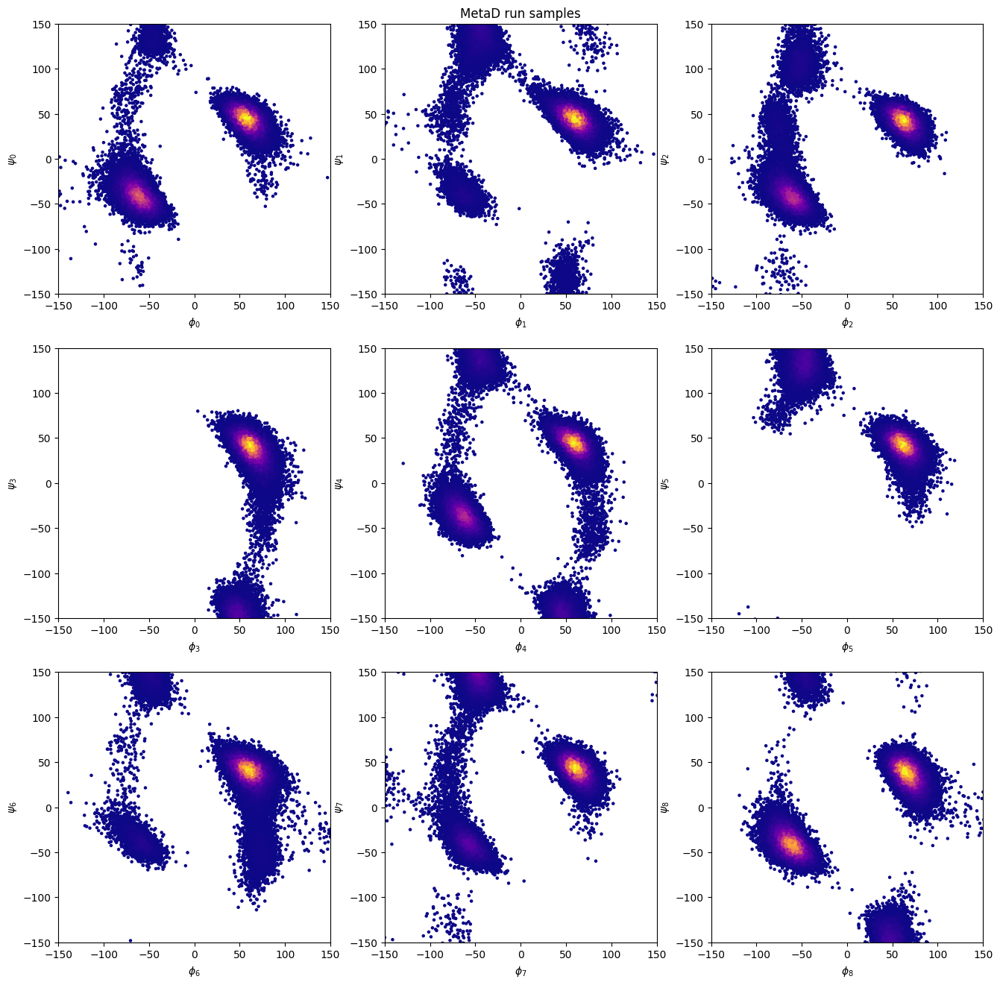

In [14]:
fig, axs = plt.subplots(3, 3, figsize=(16, 16))
axs = axs.flatten()
for i in range(CVs.shape[2]):
    axs[i].scatter(CVs[:, 0, i], CVs[:, 1, i], c=kdes[i], cmap="plasma", s=5)
    axs[i].set_ylabel(fr"$\psi_{i}$")
    axs[i].set_xlabel(fr"$\phi_{i}$")
    axs[i].set_xlim(-150, 150)
    axs[i].set_ylim(-150, 150)
axs[1].set_title("MetaD run samples")
plt.show()

In [15]:
import numpy as np
import pandas as pd

def assign_weights_to_trajectory(bias: np.ndarray,
                                 x_vals: np.ndarray,
                                 y_vals:np.ndarray,
                                 min_x: float, max_x: float,
                                 min_y: float, max_y: float) -> pd.DataFrame:
    """
    Assigns weights from a 2D grid to each (x, y) point in a trajectory based on which grid cell the point falls into.

    Args:
        bias (np.ndarray): 2D array of shape (n_grid_x, n_grid_y) with bias on a regular grid.
        x_vals (np.ndarray): Array of shape (T, ).
        y_vals (np.ndarray): Array of shape (T, ).
        min_x (float): Minimum x value of the grid.
        max_x (float): Maximum x value of the grid.
        min_y (float): Minimum y value of the grid.
        max_y (float): Maximum y value of the grid.

    Returns:
        pd.DataFrame: DataFrame with columns ['x', 'y', 'weight'] for each timestep.
    """
    n_grid_x = bias.shape[0]
    n_grid_y = bias.shape[1]
    # Compute bin width
    dx = (max_x - min_x) / n_grid_x
    dy = (max_y - min_y) / n_grid_y

    # Map coordinates to indices
    ix = np.floor((x_vals - min_x) / dx).astype(int)
    iy = np.floor((y_vals - min_y) / dy).astype(int)

    # Clamp indices to valid range
    ix = np.clip(ix, 0, n_grid_x - 1)
    iy = np.clip(iy, 0, n_grid_y - 1)

    # Extract weights
    bias_vals = bias[ix, iy]
    weights = np.exp(bias_vals/temperature/kB)

    return pd.DataFrame({'CV1': x_vals, 'CV2': y_vals, 'bias': bias_vals, "weight": weights})

In [32]:
data_df = assign_weights_to_trajectory(_totalBias,
                                 cv1_vals.numpy(),
                                 cv2_vals.numpy(),
                                 -3.2, 3.2,
                                 -3.2, 3.2)
data_df["timestep"] = np.arange(len(data_df))

In [33]:
data_df.head()

,CV1,CV2,bias,weight,timestep
0,-0.505233,-0.814734,136.808829,6.607993e+23,0
1,-0.540242,-0.798839,135.148157,3.395678e+23,1
2,-0.457977,-0.855411,138.384902,1.243033e+24,2
3,-0.479410,-0.805650,138.059486,1.090998e+24,3
4,-0.471187,-0.820733,138.279409,1.191558e+24,4


In [57]:
fig = ex.scatter(data_df, x='CV1', y="CV2", color="bias", height=600, width=800)
fig.update_layout(title_text="total bias", title_x=0.5)
fig.show()

In [34]:
def get_pmf(data_df, x, temperature, kB):
    # Histogram the weighted trajectory
    hist, x_edges = np.histogram(data_df[x],
                                 bins=50,
                                 weights=data_df['weight'])

    # Normalize to get probability density
    prob_density = hist / np.sum(hist)

    # Avoid log(0) by setting minimum positive value
    min_nonzero = np.min(prob_density[np.nonzero(prob_density)])
    prob_density[prob_density == 0] = min_nonzero

    # Convert to free energy
    fes = -kB * temperature * np.log(prob_density)
    cbar = fig.colorbar(cnt, ax=axs[i])
    cbar.set_label(fr"$\gamma_{4 - i}$")

    # with np.errstate(divide='ignore'):  # Suppress warnings for log(0)
    #     fes = -kB * temperature * np.log(prob_density)
    # fes[np.isinf(fes)] = np.inf  # Optional but explicit

    # Optional: set minimum to zero
    fes -= np.min(fes)
    return fes, x_edges

def get_free_energy_surface(data_df, x, y, temperature, kB, range):
    # Histogram the weighted trajectory
    hist, x_edges, y_edges = np.histogram2d(data_df[x], data_df[y],
                                            bins=100,
                                            range=range,
                                            weights=data_df['weight'])

    # Normalize to get probability density
    prob_density = hist / np.sum(hist)

    # Avoid log(0) by setting minimum positive value
    min_nonzero = np.min(prob_density[np.nonzero(prob_density)])
    prob_density[prob_density == 0] = min_nonzero

    # Convert to free energy
    fes = -kB * temperature * np.log(prob_density)

    # with np.errstate(divide='ignore'):  # Suppress warnings for log(0)
    #     fes = -kB * temperature * np.log(prob_density)
    # fes[np.isinf(fes)] = np.inf  # Optional but explicit

    # Optional: set minimum to zero
    fes -= np.min(fes)
    return fes, x_edges, y_edges



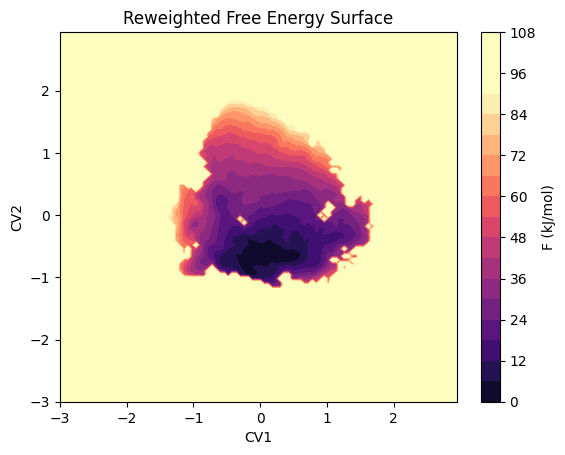

In [53]:
fes, x_edges, y_edges = get_free_energy_surface(data_df, "CV1", "CV2", temperature, kB, [[-3, 3], [-3, 3]])
plt.contourf(x_edges[:-1], y_edges[:-1], fes.T, levels=20, cmap='magma', vmin=-5, vmax=90)
plt.xlabel("CV1")
plt.ylabel("CV2")
plt.title("Reweighted Free Energy Surface")
plt.colorbar(label="F (kJ/mol)")
plt.show()

In [36]:
for i in range(CVs.shape[2]):
    data_df[f"phi{i}"] = CVs[:, 0, i]
    data_df[f"psi{i}"] = CVs[:, 1, i]

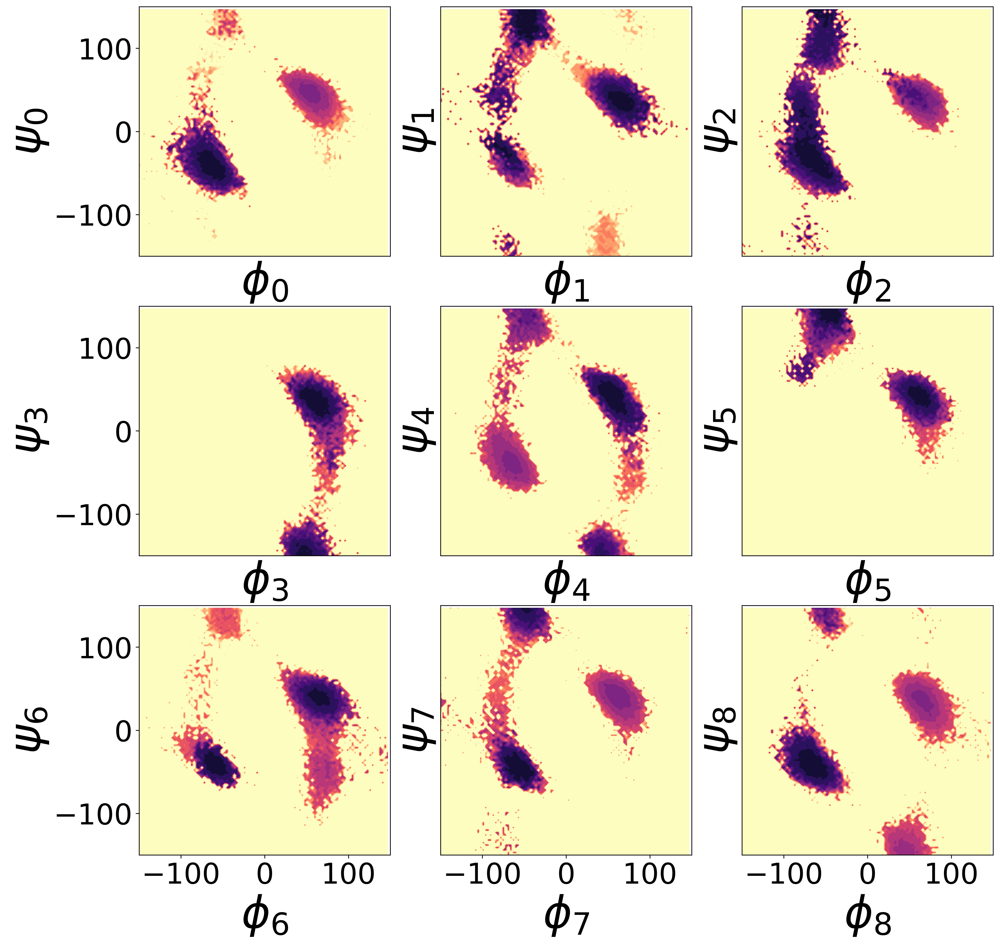

In [62]:
fig, axs = plt.subplots(3, 3, figsize=(16, 16), dpi=300)
axs = axs.flatten()
for i in range(CVs.shape[2]):
    fes, x_edges, y_edges = get_free_energy_surface(data_df, f"phi{i}", f"psi{i}", temperature, kB, [[-150, 150], [-150, 150]])
    cnt = axs[i].contourf(x_edges[:-1], y_edges[:-1], fes.T, levels=20, cmap='magma', vmin=-5, vmax=70)
    axs[i].set_xlabel(fr"$\phi_{i}$", fontsize=46)
    axs[i].set_ylabel(fr"$\psi_{i}$", fontsize=46)
    if i not in [6, 7, 8]:
        axs[i].set_xticks([])
    if i not in [0, 3, 6]:
        axs[i].set_yticks([])
    axs[i].set_xlim(-150, 150)
    axs[i].set_ylim(-150, 150)
    axs[i].tick_params(axis='both', which='major', labelsize=30)  # major ticks
    #ax.tick_params(axis='both', which='minor', labelsize=12)  # minor ticks (optional)

#axs[1].set_title("Reweighted Free Energy Surface", fontsize=50)
plt.show()


In [45]:
traj = md.load("../snrv_pd/traj_unbiased.dcd", top="../aib9.gro")

In [46]:
CVs, kdes = get_colvars(traj)

In [47]:
unbiased_df = pd.DataFrame({"weight": np.ones(CVs.shape[0], )})
for i in range(CVs.shape[2]):
    unbiased_df[f"phi{i}"] = CVs[:, 0, i]
    unbiased_df[f"psi{i}"] = CVs[:, 1, i]

In [58]:
unbiased_df

,weight,phi0,psi0,phi1,psi1,phi2,psi2,phi3,psi3,phi4,psi4,phi5,psi5,phi6,psi6,phi7,psi7,phi8,psi8
0,1.0,-51.547291,-39.790874,-71.705215,49.516056,53.163525,40.758965,65.662659,36.037594,82.088600,7.009441,-82.501633,55.111778,-43.130226,-38.068531,-60.001659,-51.108196,-69.138725,-42.300358
1,1.0,-57.654224,-45.768871,-84.637840,57.177025,55.371746,45.823280,71.349442,27.357164,75.686829,25.394840,-76.610458,50.116528,-30.092678,-57.317619,-53.638599,-41.377884,-74.785912,-48.948402
2,1.0,-46.574448,-62.320816,-82.833145,83.078003,51.572720,36.857800,66.895332,20.953453,83.344910,17.126621,-76.901596,76.566589,-55.077156,-42.652771,-46.579941,-53.835396,-77.928398,-32.004654
3,1.0,-52.428738,-51.836979,-81.656570,67.939331,51.775806,39.108257,58.196838,45.117481,74.792595,14.150883,-66.509727,58.675659,-54.615971,-30.119164,-49.127163,-52.416641,-82.100510,-46.682304
4,1.0,-54.797810,-39.056843,-65.370193,46.358150,64.621742,31.395660,59.449776,47.826111,65.160980,17.379704,-82.652763,73.025871,-70.231270,-23.852081,-51.589409,-54.215401,-73.839569,-57.115894
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,1.0,-65.746185,-23.122911,47.087387,-167.465775,56.439129,33.902706,53.812748,36.260441,81.268372,17.014946,-51.783573,-44.109646,43.148090,-130.325623,-61.711716,-36.597179,-70.270416,-24.640726
9996,1.0,-63.008015,-40.437641,53.590641,-170.281937,64.573677,28.212246,43.408508,49.785324,81.534279,27.999729,-71.084175,-33.937698,32.593166,-125.202164,-60.793827,-46.033707,-70.375557,-27.175358
9997,1.0,-62.102634,-59.117874,62.247074,-161.093002,47.018730,47.991112,57.335052,34.456093,83.055931,18.944181,-60.667179,-37.506634,39.129192,-147.793900,-39.876862,-57.832779,-60.017803,-35.515606
9998,1.0,-71.231148,-29.722076,45.099773,-170.935837,43.426926,54.990055,66.956451,26.293678,63.981918,35.103081,-46.965401,-49.594391,52.005066,-141.318085,-54.532864,-52.880852,-51.797878,-39.615936


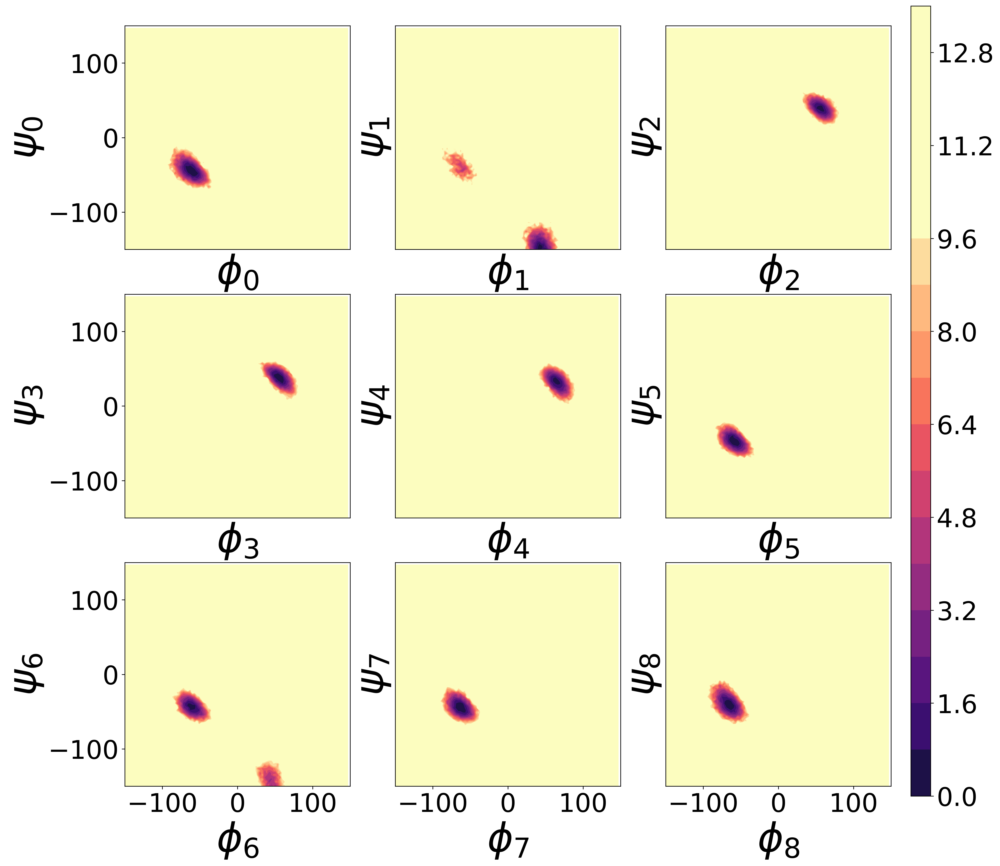

In [72]:
fig, axs = plt.subplots(3, 3, figsize=(16, 16), dpi=300)
axs = axs.flatten()

for i in range(CVs.shape[2]):
    fes, x_edges, y_edges = get_free_energy_surface(
        unbiased_df,
        f"phi{i}", f"psi{i}",
        temperature, kB,
        [[-150, 150], [-150, 150]]
    )
    cnt = axs[i].contourf(
        x_edges[:-1], y_edges[:-1], fes.T,
        levels=20, cmap='magma', vmin=-1, vmax=10
    )
    axs[i].set_xlabel(fr"$\phi_{i}$", fontsize=46)
    axs[i].set_ylabel(fr"$\psi_{i}$", fontsize=46)

    if i not in [6, 7, 8]:
        axs[i].set_xticks([])
    if i not in [0, 3, 6]:
        axs[i].set_yticks([])

    axs[i].set_xlim(-150, 150)
    axs[i].set_ylim(-150, 150)
    axs[i].tick_params(axis='both', which='major', labelsize=30)

# Add a colorbar that spans the full height of the figure
cbar_ax = fig.add_axes([0.92, 0.1, 0.02, 0.8])  
# [left, bottom, width, height] in figure coordinates

cbar = fig.colorbar(cnt, cax=cbar_ax)
cbar.ax.tick_params(labelsize=30)

plt.show()


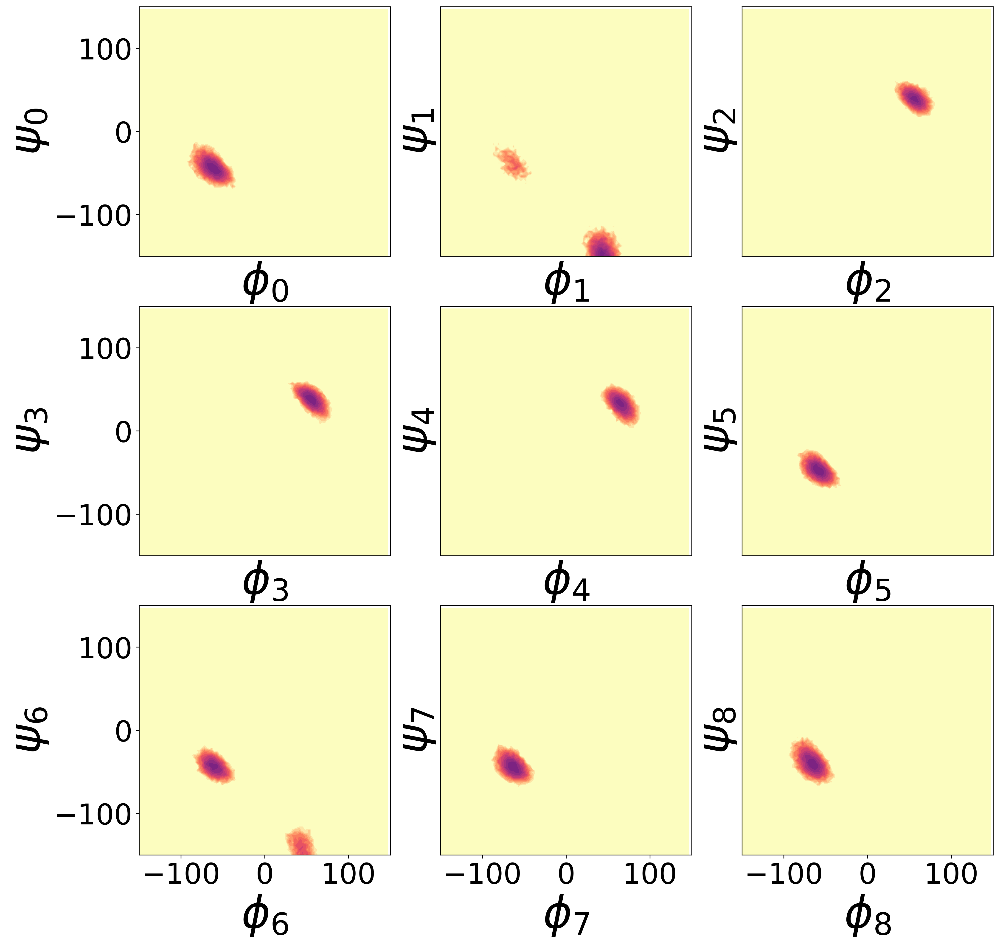

In [ ]:
fig, axs = plt.subplots(3, 3, figsize=(16, 16), dpi=300)
axs = axs.flatten()
for i in range(CVs.shape[2]):
    fes, x_edges, y_edges = get_free_energy_surface(unbiased_df, f"phi{i}", f"psi{i}", temperature, kB, [[-150, 150], [-150, 150]])
    cnt = axs[i].contourf(x_edges[:-1], y_edges[:-1], fes.T, levels=20, cmap='magma', vmin=-5, vmax=10)
    axs[i].set_xlabel(fr"$\phi_{i}$", fontsize=46)
    axs[i].set_ylabel(fr"$\psi_{i}$", fontsize=46)
    if i not in [6, 7, 8]:
        axs[i].set_xticks([])
    if i not in [0, 3, 6]:
        axs[i].set_yticks([])
    axs[i].set_xlim(-150, 150)
    axs[i].set_ylim(-150, 150)
    axs[i].tick_params(axis='both', which='major', labelsize=30)  # major ticks
plt.show()


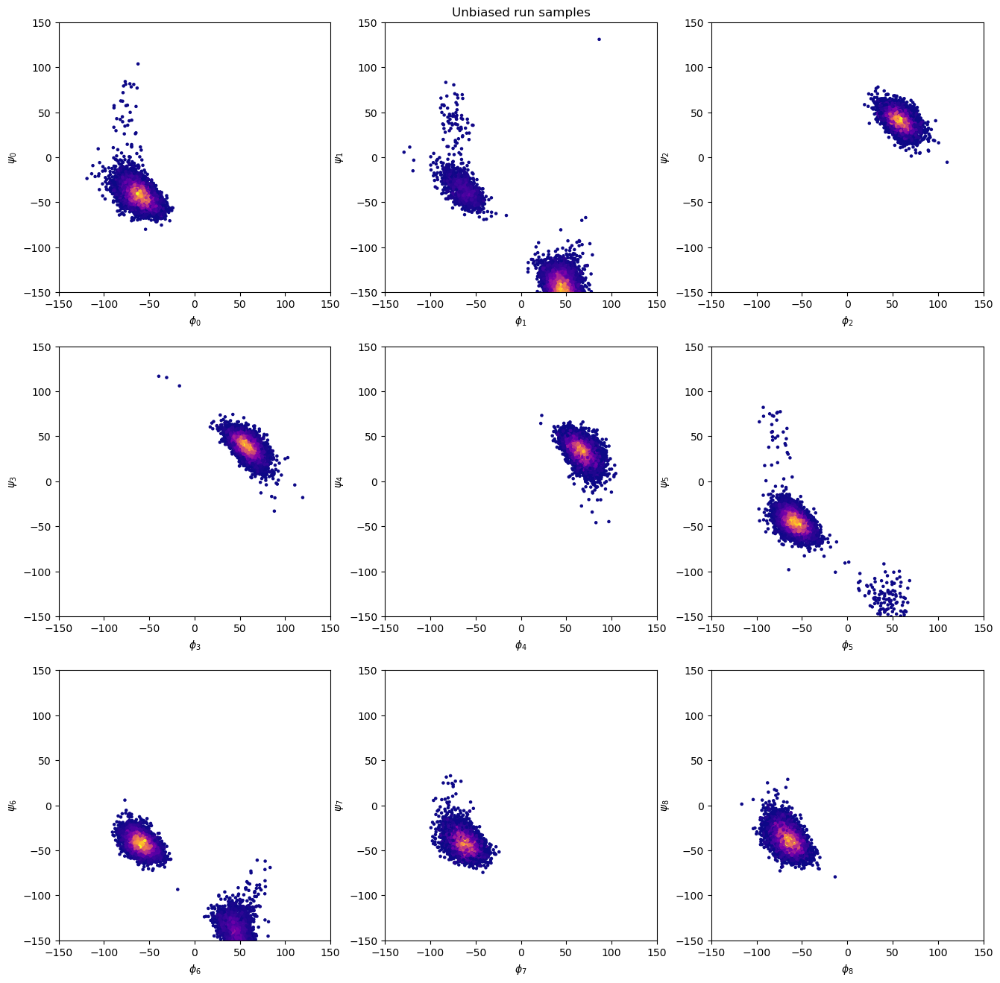

In [66]:
fig, axs = plt.subplots(3, 3, figsize=(16, 16))
axs = axs.flatten()
for i in range(CVs.shape[2]):
    axs[i].scatter(CVs[:, 0, i], CVs[:, 1, i], c=kdes[i], cmap="plasma", s=5)
    axs[i].set_ylabel(fr"$\psi_{i}$")
    axs[i].set_xlabel(fr"$\phi_{i}$")
    axs[i].set_xlim(-150, 150)
    axs[i].set_ylim(-150, 150)
axs[1].set_title("Unbiased run samples")
plt.show()

In [ ]:

    cnt = axs[i].contourf(x_edges[:-1], y_edges[:-1], fes.T, levels=20, cmap='magma', vmin=-5, vmax=70)
    axs[i
biasing_atom_ids = np.array([atom.index for atom in traj.topology.atoms if atom.residue.name != 'HOH'])
X = torch.from_numpy(traj.xyz)
boxvectors = torch.from_numpy(traj.unitcell_vectors)

In [68]:
cv1_vals = torch.zeros(X.shape[0], )
cv2_vals = torch.zeros(X.shape[0], )
for i in range(X.shape[0]):
    with torch.no_grad():
        cv1_vals[i] = (cv1(X[i, ...], boxvectors[i, ...]))
        cv2_vals[i] = (cv2(X[i, ...], boxvectors[i, ...]))

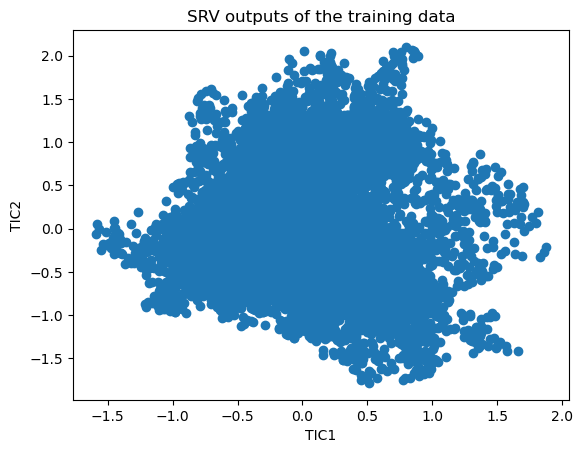

In [69]:
plt.scatter(cv1_vals, cv2_vals)
plt.xlabel("TIC1")
plt.ylabel("TIC2")
plt.title("SRV outputs of the training data")
plt.show()

In [70]:
CVs, kdes = get_colvars(traj)

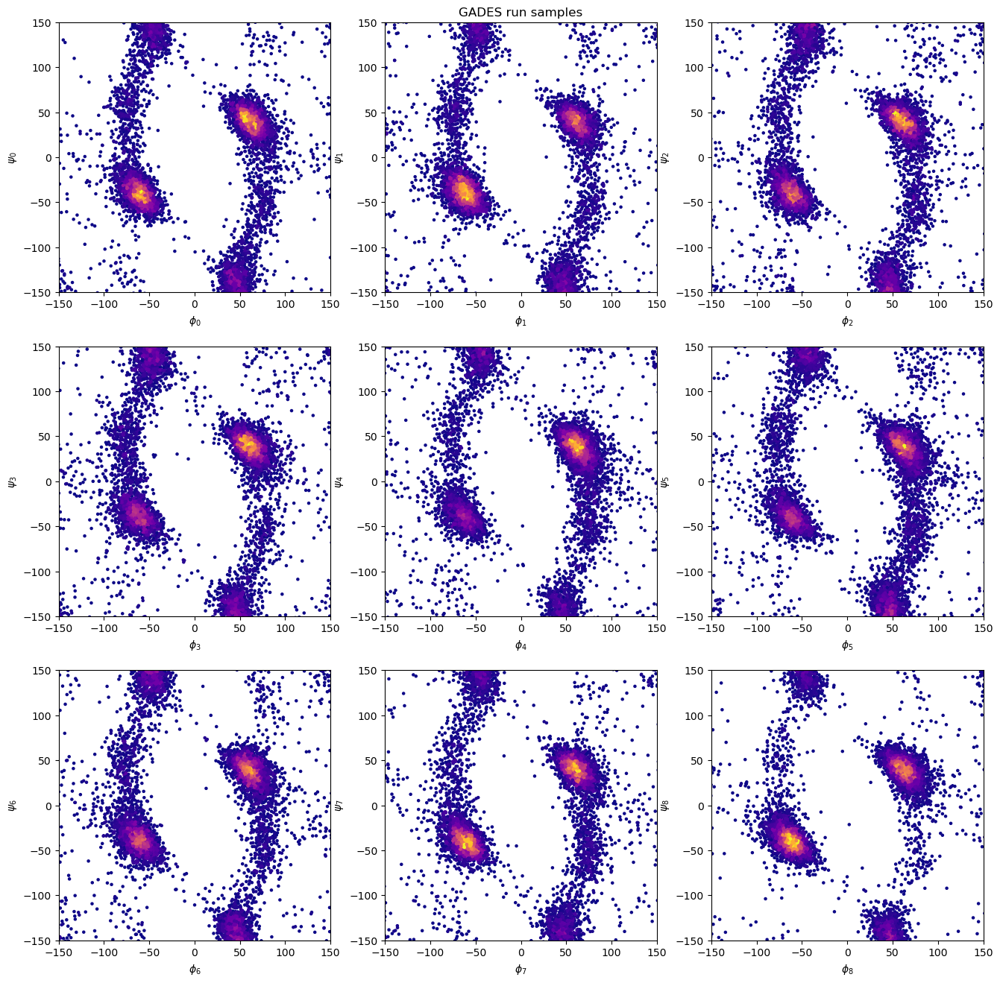

In [71]:
fig, axs = plt.subplots(3, 3, figsize=(16, 16))
axs = axs.flatten()
for i in range(CVs.shape[2]):
    axs[i].scatter(CVs[:, 0, i], CVs[:, 1, i], c=kdes[i], cmap="plasma", s=5)
    axs[i].set_ylabel(fr"$\psi_{i}$")
    axs[i].set_xlabel(fr"$\phi_{i}$")
    axs[i].set_xlim(-150, 150)
    axs[i].set_ylim(-150, 150)
axs[1].set_title("GADES run samples")
plt.show()